# COVID-19 Regional Analysis: South Asia vs Middle East

## Introduction
This project explores the COVID-19 impact on South Asia and the Middle East, focusing on:
- Total case trends over time.
- Vaccination progress.
- GDP and vaccination relationship.
- Statistical testing (t-test) and predictive modeling (Linear Regression).

## Dataset
- **Source**: [Our World in Data](https://ourworldindata.org/coronavirus)
- **File**: `owid-covid-data.csv`

## Objectives
Analyze and compare COVID-19 trends and vaccination metrics between the two regions to uncover key insights.


## **Import Libraries and Load Data**

In [19]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Load the dataset
data_path = "../data/owid-covid-data.csv"
data = pd.read_csv(data_path)
data.head()


,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,population,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-01-05,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-01-06,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-01-07,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-01-08,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-01-09,0.0,0.0,NaN,0.0,0.0,NaN,...,NaN,37.746,0.5,64.83,0.511,41128772,NaN,NaN,NaN,NaN


## Import Libraries
Necessary libraries for data manipulation, visualization, and analysis are imported.


## **1. Data Overview**

In [20]:
# Basic information about the dataset
data.info()

# Unique continents in the dataset
print("Unique Continents in dataset:", data['continent'].unique())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 429435 entries, 0 to 429434
Data columns (total 67 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   iso_code                                    429435 non-null  object 
 1   continent                                   402910 non-null  object 
 2   location                                    429435 non-null  object 
 3   date                                        429435 non-null  object 
 4   total_cases                                 411804 non-null  float64
 5   new_cases                                   410159 non-null  float64
 6   new_cases_smoothed                          408929 non-null  float64
 7   total_deaths                                411804 non-null  float64
 8   new_deaths                                  410608 non-null  float64
 9   new_deaths_smoothed                         409378 non-null  float64
 

### Data Cleaning
- Filter the dataset to include only Asian countries.
- Convert the `date` column to datetime format for easier time-series analysis.
- Addressed missing values in key metrics.


In [21]:
# Filter data for Asia
asia_data = data[data['continent'] == 'Asia']

# Define South Asian and Middle Eastern countries
south_asian_countries = ['Afghanistan', 'Bangladesh', 'Bhutan', 'India', 'Maldives', 'Nepal', 'Pakistan', 'Sri Lanka']
middle_eastern_countries = ['Armenia', 'Azerbaijan', 'Bahrain', 'Georgia', 'Iran', 'Iraq',
                            'Israel', 'Jordan', 'Kuwait', 'Lebanon', 'Oman', 'Palestine',
                            'Qatar', 'Saudi Arabia', 'Syria', 'Turkey', 'United Arab Emirates', 'Yemen']

# Combine both lists
selected_countries = south_asian_countries + middle_eastern_countries

# Filter data for the selected countries
selected_countries_data = asia_data[asia_data['location'].isin(selected_countries)]

# Convert 'date' column to datetime format
selected_countries_data['date'] = pd.to_datetime(selected_countries_data['date'])
selected_countries_data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 43532 entries, 0 to 426086
Data columns (total 67 columns):
 #   Column                                      Non-Null Count  Dtype         
---  ------                                      --------------  -----         
 0   iso_code                                    43532 non-null  object        
 1   continent                                   43532 non-null  object        
 2   location                                    43532 non-null  object        
 3   date                                        43532 non-null  datetime64[ns]
 4   total_cases                                 43524 non-null  float64       
 5   new_cases                                   43523 non-null  float64       
 6   new_cases_smoothed                          43393 non-null  float64       
 7   total_deaths                                43524 non-null  float64       
 8   new_deaths                                  43524 non-null  float64       
 9   new_d

### Regional Selection
Focused on:
- **South Asia**: Afghanistan, Bangladesh, Bhutan, India, Maldives, Nepal, Pakistan, Sri Lanka.
- **Middle East**: Armenia, Azerbaijan, Bahrain, Georgia, Iran, Iraq, Israel, Jordan, Kuwait, Lebanon, Oman, Palestine, Qatar, Saudi Arabia, Syria, Turkey, UAE, Yemen.


## **3. Visualizations**


### Total Cases Trends
Visualizing total cases over time for South Asia and the Middle East. You can toggle between both South Asia and Middle East countries.


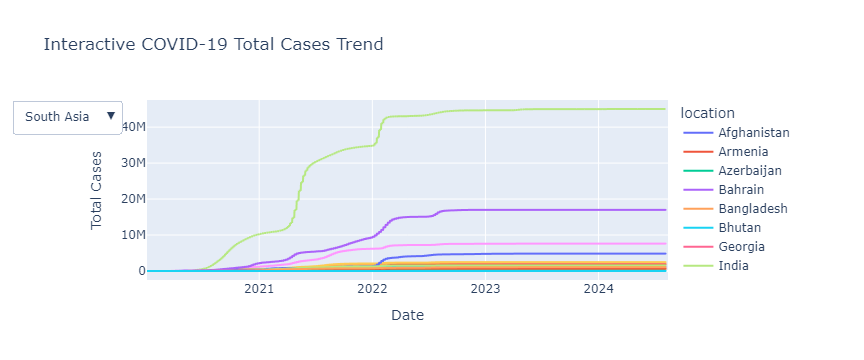

In [22]:
fig = px.line(selected_countries_data, x='date', y='total_cases', color='location',
              title="Interactive COVID-19 Total Cases Trend",
              labels={"date": "Date", "total_cases": "Total Cases"},
              hover_data={"location": True})
fig.update_layout(updatemenus=[dict(buttons=list([
    dict(label="South Asia",
         method="update",
         args=[{"visible": [country in south_asian_countries for country in selected_countries]},
               {"title": "South Asia Total Cases"}]),
    dict(label="Middle East",
         method="update",
         args=[{"visible": [country in middle_eastern_countries for country in selected_countries]},
               {"title": "Middle East Total Cases"}])
]),
    direction="down"
)])
fig.show()


### Vaccination Progress
This visualization shows the number of fully vaccinated people in each country over time.


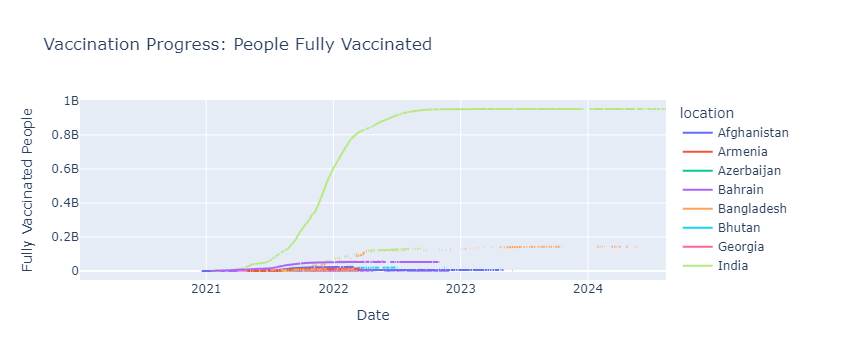

In [23]:
fig = px.line(selected_countries_data, x='date', y='people_fully_vaccinated', color='location',
              title="Vaccination Progress: People Fully Vaccinated",
              labels={"date": "Date", "people_fully_vaccinated": "Fully Vaccinated People"})
fig.show()

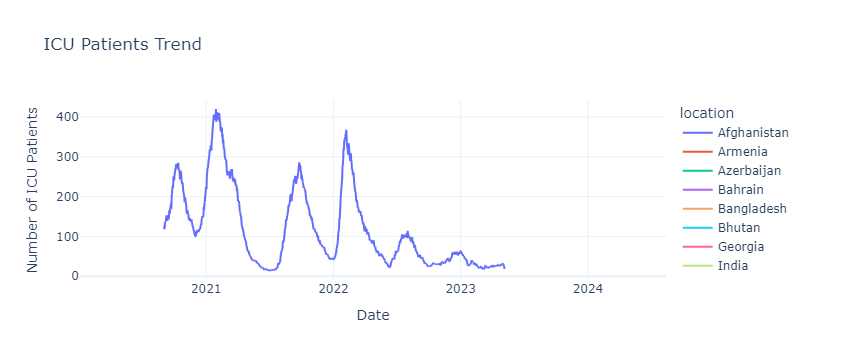

In [24]:
# Filter ICU and hospital patient data
healthcare_data = selected_countries_data[['location', 'date', 'icu_patients', 'hosp_patients']]

# Plot ICU patients trend
# Interactive ICU patients trend
icu_data_long = healthcare_data.melt(id_vars=['location', 'date'], 
                                     value_vars=['icu_patients'], 
                                     var_name='Metric', 
                                     value_name='Count')

fig = px.line(icu_data_long, x='date', y='Count', color='location',
              title="ICU Patients Trend",
              labels={"date": "Date", "Count": "Number of ICU Patients"},
              hover_name="location")
fig.update_layout(template="plotly_white", xaxis_title="Date", yaxis_title="Number of ICU Patients")
fig.show()


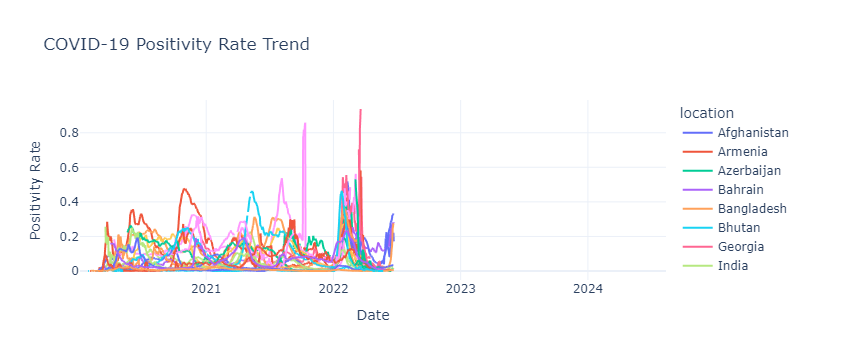

In [25]:
# Filter testing and positivity data
testing_data = selected_countries_data[['location', 'date', 'total_tests', 'positive_rate']]

# Interactive positivity rate trends
positivity_data_long = testing_data.melt(id_vars=['location', 'date'], 
                                         value_vars=['positive_rate'], 
                                         var_name='Metric', 
                                         value_name='Rate')

fig = px.line(positivity_data_long, x='date', y='Rate', color='location',
              title="COVID-19 Positivity Rate Trend",
              labels={"date": "Date", "Rate": "Positivity Rate"},
              hover_name="location")
fig.update_layout(template="plotly_white", xaxis_title="Date", yaxis_title="Positivity Rate")
fig.show()


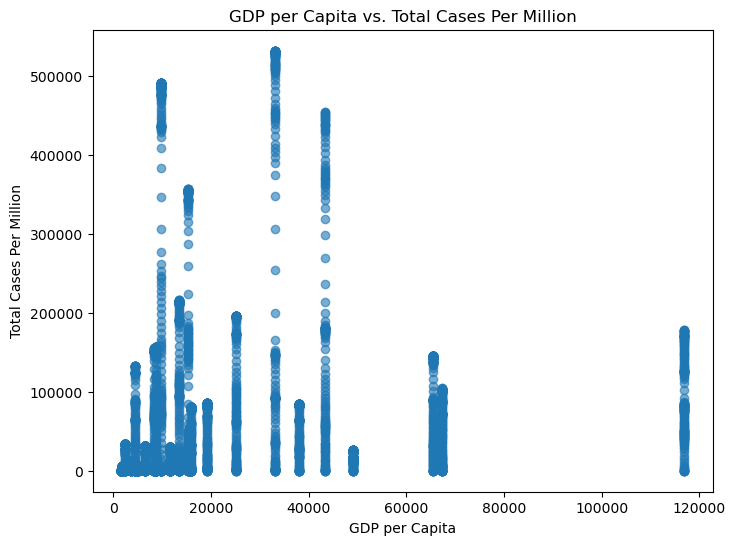

In [26]:
# Compare GDP per capita with total cases per million
economic_data = selected_countries_data[['location', 'gdp_per_capita', 'total_cases_per_million']].drop_duplicates()

# Plot GDP per capita vs. total cases per million
plt.figure(figsize=(8, 6))
plt.scatter(economic_data['gdp_per_capita'], economic_data['total_cases_per_million'], alpha=0.6)
plt.title("GDP per Capita vs. Total Cases Per Million")
plt.xlabel("GDP per Capita")
plt.ylabel("Total Cases Per Million")
plt.show()


## **4. Feature Engineering**

In [27]:
# Add basic features
selected_countries_data['case_fatality_rate'] = selected_countries_data['total_deaths'] / selected_countries_data['total_cases']
selected_countries_data['vaccination_progress'] = (selected_countries_data['people_fully_vaccinated'] / selected_countries_data['population']) * 100

# Drop rows with missing values in the new features
selected_countries_data = selected_countries_data.dropna(subset=['case_fatality_rate', 'vaccination_progress'])

- **Case Fatality Rate**: Ratio of total deaths to total cases.
- **Vaccination Progress**: Percentage of the population fully vaccinated.

## **5. Correlation Analysis**

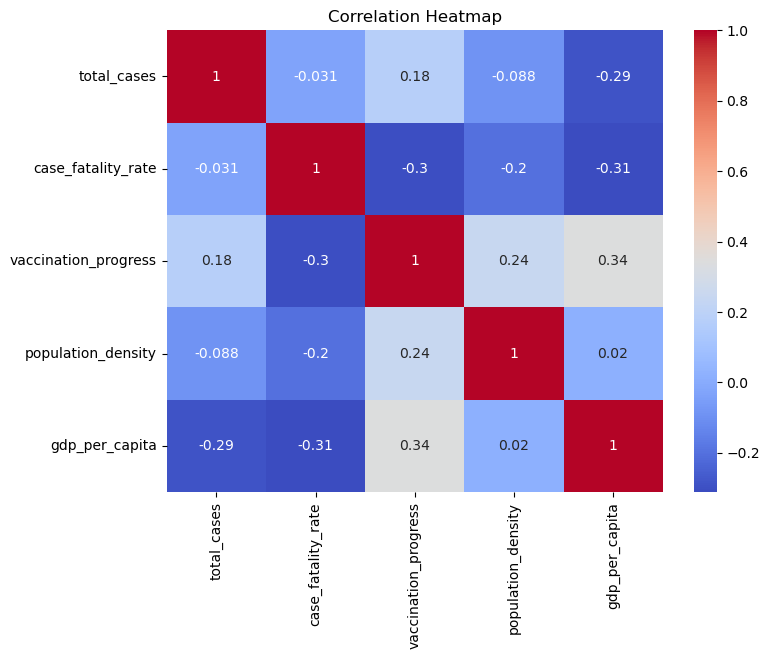

                      total_cases  case_fatality_rate  vaccination_progress  \
total_cases              1.000000           -0.030606              0.180045   
case_fatality_rate      -0.030606            1.000000             -0.303787   
vaccination_progress     0.180045           -0.303787              1.000000   
population_density      -0.088361           -0.203968              0.242738   
gdp_per_capita          -0.289094           -0.311862              0.343867   

                      population_density  gdp_per_capita  
total_cases                    -0.088361       -0.289094  
case_fatality_rate             -0.203968       -0.311862  
vaccination_progress            0.242738        0.343867  
population_density              1.000000        0.020393  
gdp_per_capita                  0.020393        1.000000  


In [28]:
# Compute correlation matrix
correlation_matrix = selected_countries_data[['total_cases', 'case_fatality_rate', 'vaccination_progress',
                                              'population_density', 'gdp_per_capita']].corr()

# Visualize the correlation matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

print(correlation_matrix)


**Result**:
This suggests that, on average, countries with higher GDP per capita tend to have better vaccination progress, but the relationship is not strong.

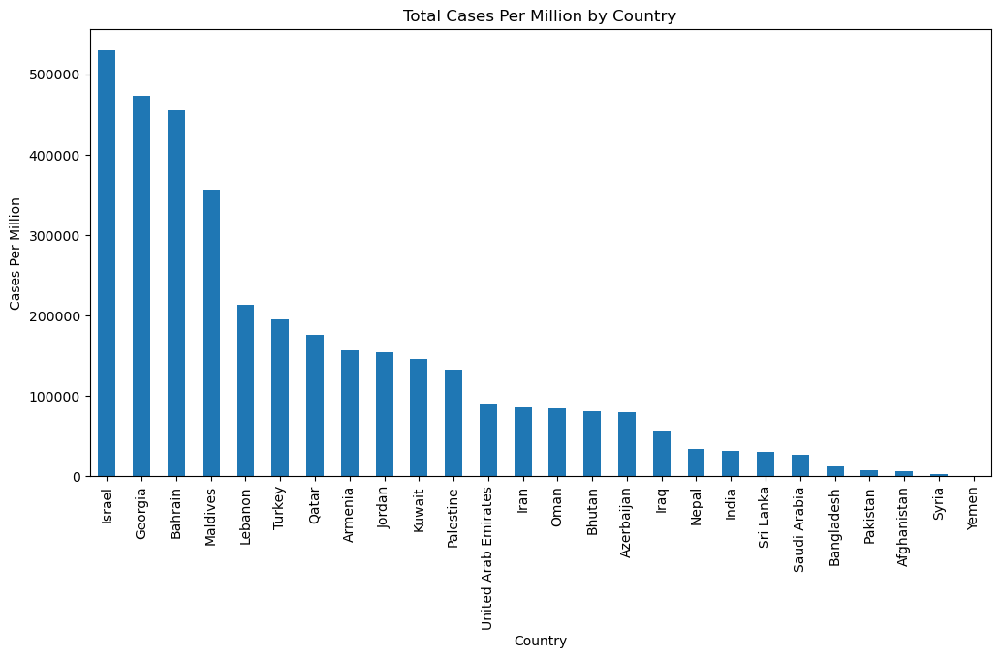

In [29]:
# Total cases per million comparison
total_cases_per_million = selected_countries_data.groupby('location')['total_cases_per_million'].max()

plt.figure(figsize=(12, 6))
total_cases_per_million.sort_values(ascending=False).plot(kind='bar')
plt.title("Total Cases Per Million by Country")
plt.ylabel("Cases Per Million")
plt.xlabel("Country")
plt.show()


In [30]:
# Feature Engineering
selected_countries_data['case_fatality_rate'] = selected_countries_data['total_deaths'] / selected_countries_data['total_cases']
selected_countries_data['vaccination_progress'] = (selected_countries_data['people_fully_vaccinated'] / selected_countries_data['population']) * 100
selected_countries_data['cases_per_test'] = selected_countries_data['total_cases'] / selected_countries_data['total_tests']
selected_countries_data['deaths_per_million'] = selected_countries_data['total_deaths'] / (selected_countries_data['population'] / 1e6)

# Drop rows with NaN in key features to prepare for modeling
selected_countries_data = selected_countries_data.dropna(subset=['case_fatality_rate', 'vaccination_progress', 'cases_per_test', 'deaths_per_million'])

# Display a preview of the data with new features
selected_countries_data[['location', 'case_fatality_rate', 'vaccination_progress', 'cases_per_test', 'deaths_per_million']].head()


,location,case_fatality_rate,vaccination_progress,cases_per_test,deaths_per_million
17276,Armenia,0.020060,0.423813,0.194535,1617.710950
17283,Armenia,0.020054,0.582491,0.190860,1621.307461
17297,Armenia,0.020072,1.102619,0.182835,1634.254903
17304,Armenia,0.020077,1.313446,0.178914,1642.167229
17311,Armenia,0.020048,1.577250,0.174608,1649.719904


In [31]:
# Correlation for South Asia
south_asia_data = selected_countries_data[selected_countries_data['location'].isin(south_asian_countries)]
correlation_south_asia = south_asia_data[['gdp_per_capita', 'vaccination_progress']].corr()

# Correlation for Middle East
middle_east_data = selected_countries_data[selected_countries_data['location'].isin(middle_eastern_countries)]
correlation_middle_east = middle_east_data[['gdp_per_capita', 'vaccination_progress']].corr()

print("South Asia Correlation:\n", correlation_south_asia)
print("Middle East Correlation:\n", correlation_middle_east)


South Asia Correlation:
                       gdp_per_capita  vaccination_progress
gdp_per_capita               1.00000               0.46626
vaccination_progress         0.46626               1.00000
Middle East Correlation:
                       gdp_per_capita  vaccination_progress
gdp_per_capita              1.000000              0.598334
vaccination_progress        0.598334              1.000000


In [32]:
# Apply log transformation to GDP per capita
selected_countries_data['log_gdp_per_capita'] = np.log1p(selected_countries_data['gdp_per_capita'])

# Recalculate correlation
log_correlation = selected_countries_data[['log_gdp_per_capita', 'vaccination_progress']].corr()
print("Log-Transformed GDP Correlation:\n", log_correlation)


Log-Transformed GDP Correlation:
                       log_gdp_per_capita  vaccination_progress
log_gdp_per_capita              1.000000              0.560035
vaccination_progress            0.560035              1.000000


**Result:**
1. South Asia **`(r=0.47)`** shows a weaker dependence on GDP per capita, indicating the influence of non-economic factors like government policies or population density.
2. Middle East **`(r=0.60)`** relies more heavily on economic strength to drive vaccination progress.


## **6. Linear Regression**

In [33]:
!pip install scikit-learn
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Select features and target variable
features = ['population_density', 'gdp_per_capita', 'case_fatality_rate', 'vaccination_progress']
target = 'total_cases'

# Prepare the data
X = selected_countries_data[features]
y = selected_countries_data[target]

# Creating an imputer to replace NaN with the mean
imputer = SimpleImputer(strategy='median')

# Fit the imputer on the training data and transform both training and testing data
X = imputer.fit_transform(X)

# Split into training and test sets after imputation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=89)

# Train the Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


LinearRegression()

In [34]:

# Make predictions
y_pred = lr_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R² Score:", r2)

# Display model coefficients
coefficients = pd.DataFrame({'Feature': features, 'Coefficient': lr_model.coef_})
print(coefficients)


Mean Squared Error: 105107133297680.0
R² Score: 0.13736526161940754
                Feature   Coefficient
0    population_density -3.178425e+03
1        gdp_per_capita -2.240774e+02
2    case_fatality_rate -2.482511e+08
3  vaccination_progress  5.414313e+04


## **9. Hypothesis Testing**
a. t-test: Compare Vaccination Progress Between South Asia and Middle East

In [35]:
from scipy.stats import ttest_ind

# Subset data
south_asia = selected_countries_data[selected_countries_data['location'].isin(south_asian_countries)]['vaccination_progress']
middle_east = selected_countries_data[selected_countries_data['location'].isin(middle_eastern_countries)]['vaccination_progress']

# Perform t-test
t_stat, p_value = ttest_ind(south_asia, middle_east, nan_policy='omit')
print(f"T-statistic: {t_stat}, P-value: {p_value}")


T-statistic: -16.845617631388606, P-value: 1.3633993084284168e-61


## **10. Time-Series Moving Averages**

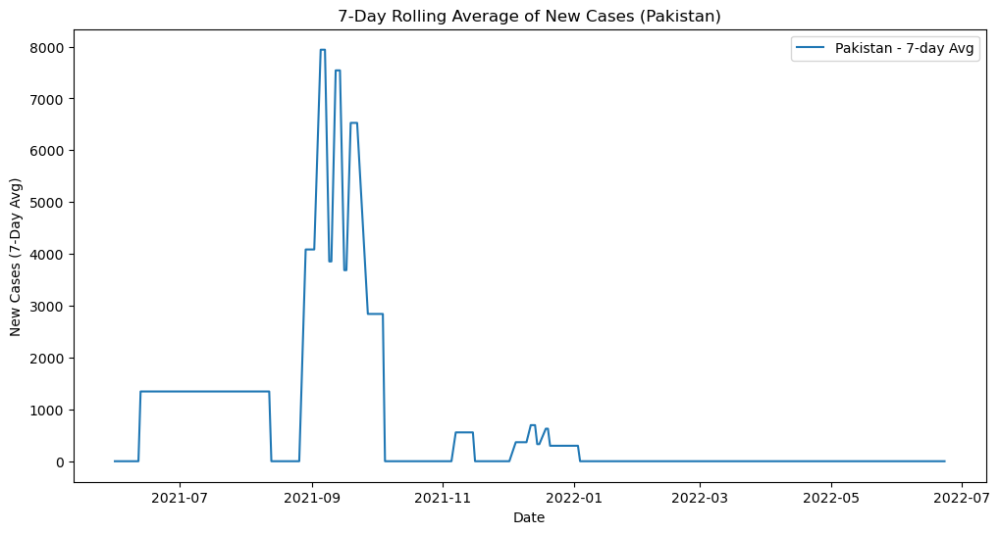

In [36]:
# Compute 7-day rolling average for new cases
selected_countries_data['new_cases_7d_avg'] = selected_countries_data.groupby('location')['new_cases'].transform(lambda x: x.rolling(window=7).mean())

# Plot the rolling average for Pakistan
plt.figure(figsize=(12, 6))
pakistan_data = selected_countries_data[selected_countries_data['location'] == 'Pakistan']
plt.plot(pakistan_data['date'], pakistan_data['new_cases_7d_avg'], label='Pakistan - 7-day Avg')
plt.title("7-Day Rolling Average of New Cases (Pakistan)")
plt.xlabel("Date")
plt.ylabel("New Cases (7-Day Avg)")
plt.legend()
plt.show()


### **Conclusion**
- Vaccination progress differs significantly between South Asia and the Middle East.
- GDP per capita shows a positive correlation with vaccination progress.
- Linear regression identifies GDP and vaccination progress as key predictors of total cases.

### **Future Work**
- Explore policy and healthcare infrastructure impacts.
- Perform advanced predictive modeling with additional variables.
